# BUCSS 2026
## AI Session Hands-On Part 2: Training different models for Task 2-2 Dortmund

In this notebook you will:
- Load the training data
- Train AI models (Random Forest)
- Vary station subsets for training and validation

In [ ]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cmcrameri.cm as cmc
import random
import seaborn as sns
import time

from sklearn.model_selection import GroupShuffleSplit, GroupKFold
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, root_mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor

#These are internal
import sys
sys.path.insert(0, "../scripts")
# print(sys.path)
from splitting_and_training import split_data, scale_data, train_model, feature_selection, prepare_station_training_data, explain_model, calc_importance
from plotting import obs_map, plot_scatter_and_residuals, plot_stats, plot_importance, plot_shap_summary

random.seed(42)  # define seed to create deterministic results by pseudo-randomness

In [2]:
city = "dortmund"
target = "temp_diff"

# 1) Load data
df = pd.read_parquet(f"../dataframes_for_training/{city}_training.parquet")

hod = df["datetime_utc"].dt.hour
doy = df["datetime_utc"].dt.dayofyear
df["tod_sin"] = np.sin(2 * np.pi * hod / 24)
df["tod_cos"] = np.cos(2 * np.pi * hod / 24)
df["doy_sin"] = np.sin(2 * np.pi * doy / 365)
df["doy_cos"] = np.cos(2 * np.pi * doy / 365)

# All Stations
print(f'Stations: {list(df["station_id"].unique())}')

# (the defined target) DeltaT
df["temp_diff"] = df["air_temperature"] - df["t2m_corr"]

df["datetime_utc"].min(), df["datetime_utc"].max(), df.columns

Stations: ['DOBBHS', 'DOBBRS', 'DOBCLA', 'DOBDHS', 'DOBDKP', 'DOBDOU', 'DOBGAS', 'DOBHAN', 'DOBHAP', 'DOBHBF', 'DOBHKS', 'DOBKPW', 'DOBMSP', 'DOBNOM', 'DOBOHS', 'DOBPSW', 'DOBSBA', 'DOBSPS', 'DOBWEP', 'DOBWFH', 'DOBWFP', 'DODBOL', 'DODFRP', 'DODGWS', 'DODPHX', 'DOTABA', 'DOTABS', 'DOTADK', 'DOTADR', 'DOTADS', 'DOTAKU', 'DOTAMB', 'DOTAMS', 'DOTAMW', 'DOTAWG', 'DOTAWS', 'DOTBES', 'DOTBGS', 'DOTBHS', 'DOTBOS', 'DOTBSW', 'DOTEPM', 'DOTFBK', 'DOTFBP', 'DOTFHS', 'DOTFLU', 'DOTGRW', 'DOTHGW', 'DOTHSB', 'DOTIRS', 'DOTKLS', 'DOTKNS', 'DOTKOH', 'DOTKPS', 'DOTLST', 'DOTLTS', 'DOTOFH', 'DOTOHS', 'DOTPHX', 'DOTPKW', 'DOTPZW', 'DOTSBS', 'DOTSCS', 'DOTSFH', 'DOTSRW', 'DOTSTB', 'DOTSTS', 'DOTSWH', 'DOTSWS', 'DOTTPS', 'DOTVGS', 'DOTWBB', 'DOTWBS', 'DOTWFP', 'DOTWLW', 'DOTZHE']


(Timestamp('2025-01-01 01:00:00+0000', tz='UTC'),
 Timestamp('2025-12-31 23:00:00+0000', tz='UTC'),
 Index(['station_id', 'latitude', 'longitude', 'datetime_utc',
        'air_temperature', 'bh_nearest', 'bh_buf50', 'bh_buf100', 'bh_buf250',
        'bh_buf500', 'bh_buf750', 'bh_buf1000', 'tcd_nearest', 'tcd_buf50',
        'tcd_buf100', 'tcd_buf250', 'tcd_buf500', 'tcd_buf750', 'tcd_buf1000',
        'imp_nearest', 'imp_buf50', 'imp_buf100', 'imp_buf250', 'imp_buf500',
        'imp_buf750', 'imp_buf1000', 'dtm_nearest', 'lcz_nearest', 'LCZ_1',
        'LCZ_2', 'LCZ_3', 'LCZ_4', 'LCZ_5', 'LCZ_6', 'LCZ_7', 'LCZ_8', 'LCZ_9',
        'LCZ_10', 'LCZ_11', 'LCZ_12', 'LCZ_13', 'LCZ_14', 'LCZ_15', 'LCZ_16',
        'LCZ_17', 't2m', 'd2m', 'ssrd', 'tp', 'u10', 'v10', 'sp', 'ssrd_deac',
        'tp_deac', 'rh', 'wspd', 't2m_corr', 'tod_sin', 'tod_cos', 'doy_sin',
        'doy_cos', 'temp_diff'],
       dtype='str'))

### Select a station subset to train on, keep remaining data as validation set

In [3]:
# random selection
stations = list(df["station_id"].unique())
# VARY n TO CHANGE THE NUMBER OF STATIONS THAT SHOULD BE SELECTED FOR TRAINING
n = 3
train_station_subset = random.sample(stations, n)

train_sample = df[df["station_id"].isin(train_station_subset)]
val_sample = df[~df["station_id"].isin(train_station_subset)]


display(train_sample)
display(val_sample)

,station_id,latitude,longitude,datetime_utc,air_temperature,bh_nearest,bh_buf50,bh_buf100,bh_buf250,bh_buf500,...,ssrd_deac,tp_deac,rh,wspd,t2m_corr,tod_sin,tod_cos,doy_sin,doy_cos,temp_diff
25874,DOBDHS,51.502922,7.510753,2025-01-01 01:00:00+00:00,3.866667,0.0,2.493827,1.728707,1.944926,1.714213,...,0.0,0.000028,88.337914,7.304232,4.591426,0.258819,0.965926,1.721336e-02,0.999852,-0.724760
25875,DOBDHS,51.502922,7.510753,2025-01-01 02:00:00+00:00,4.083333,0.0,2.493827,1.728707,1.944926,1.714213,...,0.0,0.000008,86.115990,7.251199,4.886562,0.500000,0.866025,1.721336e-02,0.999852,-0.803229
25876,DOBDHS,51.502922,7.510753,2025-01-01 03:00:00+00:00,4.472727,0.0,2.493827,1.728707,1.944926,1.714213,...,0.0,0.000006,82.383057,7.224560,4.955440,0.707107,0.707107,1.721336e-02,0.999852,-0.482713
25877,DOBDHS,51.502922,7.510753,2025-01-01 04:00:00+00:00,4.390000,0.0,2.493827,1.728707,1.944926,1.714213,...,0.0,0.000001,79.105881,7.209552,4.799770,0.866025,0.500000,1.721336e-02,0.999852,-0.409770
25878,DOBDHS,51.502922,7.510753,2025-01-01 05:00:00+00:00,4.772727,0.0,2.493827,1.728707,1.944926,1.714213,...,0.0,0.000001,76.233780,7.146162,4.710750,0.965926,0.258819,1.721336e-02,0.999852,0.061977
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
291522,DOTAWS,51.548256,7.561384,2025-12-31 19:00:00+00:00,3.056357,0.0,0.111111,0.066246,0.026517,0.013767,...,0.0,0.000058,96.345497,4.188706,2.101085,-0.965926,0.258819,6.432491e-16,1.000000,0.955272
291523,DOTAWS,51.548256,7.561384,2025-12-31 20:00:00+00:00,2.926967,0.0,0.111111,0.066246,0.026517,0.013767,...,0.0,0.000053,96.358200,4.323840,1.938578,-0.866025,0.500000,6.432491e-16,1.000000,0.988389
291524,DOTAWS,51.548256,7.561384,2025-12-31 21:00:00+00:00,2.619091,0.0,0.111111,0.066246,0.026517,0.013767,...,0.0,0.000038,95.569077,4.513234,1.661296,-0.707107,0.707107,6.432491e-16,1.000000,0.957795
291525,DOTAWS,51.548256,7.561384,2025-12-31 22:00:00+00:00,2.236566,0.0,0.111111,0.066246,0.026517,0.013767,...,0.0,0.000025,94.672226,4.715606,1.245768,-0.500000,0.866025,6.432491e-16,1.000000,0.990798


,station_id,latitude,longitude,datetime_utc,air_temperature,bh_nearest,bh_buf50,bh_buf100,bh_buf250,bh_buf500,...,ssrd_deac,tp_deac,rh,wspd,t2m_corr,tod_sin,tod_cos,doy_sin,doy_cos,temp_diff
0,DOBBHS,51.509096,7.456684,2025-01-01 01:00:00+00:00,4.233333,0.0,6.851852,9.507887,7.545640,7.000000,...,0.0,0.000028,88.337914,7.304232,4.701927,0.258819,0.965926,1.721336e-02,0.999852,-0.468593
1,DOBBHS,51.509096,7.456684,2025-01-01 02:00:00+00:00,4.400000,0.0,6.851852,9.507887,7.545640,7.000000,...,0.0,0.000008,86.115990,7.251199,4.997062,0.500000,0.866025,1.721336e-02,0.999852,-0.597062
2,DOBBHS,51.509096,7.456684,2025-01-01 03:00:00+00:00,4.772727,0.0,6.851852,9.507887,7.545640,7.000000,...,0.0,0.000006,82.383057,7.224560,5.065940,0.707107,0.707107,1.721336e-02,0.999852,-0.293213
3,DOBBHS,51.509096,7.456684,2025-01-01 04:00:00+00:00,4.800000,0.0,6.851852,9.507887,7.545640,7.000000,...,0.0,0.000001,79.105881,7.209552,4.910270,0.866025,0.500000,1.721336e-02,0.999852,-0.110270
4,DOBBHS,51.509096,7.456684,2025-01-01 05:00:00+00:00,5.327273,0.0,6.851852,9.507887,7.545640,7.000000,...,0.0,0.000001,76.233780,7.146162,4.821250,0.965926,0.258819,1.721336e-02,0.999852,0.506022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
617031,DOTZHE,51.464670,7.402959,2025-12-31 19:00:00+00:00,2.819785,0.0,0.000000,0.000000,0.135135,0.065902,...,0.0,0.000058,96.345497,4.188706,1.877485,-0.965926,0.258819,6.432491e-16,1.000000,0.942301
617032,DOTZHE,51.464670,7.402959,2025-12-31 20:00:00+00:00,2.644879,0.0,0.000000,0.000000,0.135135,0.065902,...,0.0,0.000053,96.358200,4.323840,1.714978,-0.866025,0.500000,6.432491e-16,1.000000,0.929900
617033,DOTZHE,51.464670,7.402959,2025-12-31 21:00:00+00:00,2.293508,0.0,0.000000,0.000000,0.135135,0.065902,...,0.0,0.000038,95.569077,4.513234,1.437696,-0.707107,0.707107,6.432491e-16,1.000000,0.855812
617034,DOTZHE,51.464670,7.402959,2025-12-31 22:00:00+00:00,2.135291,0.0,0.000000,0.000000,0.135135,0.065902,...,0.0,0.000025,94.672226,4.715606,1.022168,-0.500000,0.866025,6.432491e-16,1.000000,1.113123


In [4]:
print("Training Sample")
display(train_sample.describe())
print("Validation Sample")
display(val_sample.describe())

Training Sample


,latitude,longitude,air_temperature,bh_nearest,bh_buf50,bh_buf100,bh_buf250,bh_buf500,bh_buf750,bh_buf1000,...,ssrd_deac,tp_deac,rh,wspd,t2m_corr,tod_sin,tod_cos,doy_sin,doy_cos,temp_diff
count,18665.000000,18665.000000,18665.000000,18665.0,18665.000000,18665.000000,18665.000000,18665.000000,18665.000000,18665.000000,...,1.866500e+04,1.866500e+04,18665.000000,18665.000000,18665.000000,18665.000000,1.866500e+04,18665.000000,18665.000000,18665.000000
mean,51.520330,7.510524,12.317800,0.0,2.932756,2.563498,2.438909,2.040857,1.675127,1.647687,...,4.454538e+05,9.253471e-05,76.167511,3.144403,11.910119,-0.000950,-5.634676e-05,-0.185771,-0.012634,0.407681
std,0.017528,0.027312,6.896903,0.0,1.756779,1.881312,1.582687,1.269540,0.880156,0.790511,...,7.046859e+05,2.926553e-04,16.004520,1.509665,6.858452,0.707137,7.071137e-01,0.699964,0.689515,1.379227
min,51.502922,7.483275,-6.351454,0.0,0.111111,0.066246,0.026517,0.013767,0.036456,0.149537,...,0.000000e+00,0.000000e+00,29.353836,0.085784,-10.296177,-1.000000,-1.000000e+00,-0.999991,-0.999963,-7.195517
25%,51.502922,7.483275,7.727273,0.0,2.493827,1.728707,1.944926,1.714213,1.667365,1.672343,...,0.000000e+00,0.000000e+00,65.128769,2.035230,7.352687,-0.707107,-7.071068e-01,-0.849817,-0.658402,-0.328906
50%,51.528219,7.510753,12.462500,0.0,2.493827,1.728707,1.944926,1.714213,1.667365,1.672343,...,1.424800e+04,7.823110e-07,79.341019,2.873247,12.185075,0.000000,-1.836970e-16,-0.353676,-0.047321,0.477132
75%,51.528219,7.510753,16.963636,0.0,5.000000,4.974763,4.361040,3.540727,2.553581,2.409428,...,6.610560e+05,3.585219e-05,89.458725,4.089783,16.633562,0.707107,7.071068e-01,0.486273,0.677615,1.247760
max,51.548256,7.561384,36.557143,0.0,5.000000,4.974763,4.361040,3.540727,2.553581,2.409428,...,3.172674e+06,4.089609e-03,100.007248,10.218052,33.664810,1.000000,1.000000e+00,0.999991,1.000000,8.224356


Validation Sample


,latitude,longitude,air_temperature,bh_nearest,bh_buf50,bh_buf100,bh_buf250,bh_buf500,bh_buf750,bh_buf1000,...,ssrd_deac,tp_deac,rh,wspd,t2m_corr,tod_sin,tod_cos,doy_sin,doy_cos,temp_diff
count,598371.000000,598371.000000,598371.000000,598371.000000,598371.000000,598371.000000,598371.000000,598371.000000,598371.000000,598371.000000,...,5.983710e+05,5.983710e+05,598371.000000,598371.000000,598371.000000,5.983710e+05,5.983710e+05,598371.000000,598371.000000,598371.000000
mean,51.516463,7.465046,12.059304,1.097246,2.590236,2.703018,2.620182,2.365321,2.189950,2.059138,...,4.665204e+05,9.150474e-05,75.765167,3.077149,11.485607,7.385268e-04,-7.857034e-05,-0.019679,-0.014990,0.573696
std,0.031423,0.057997,7.309426,3.436350,2.821962,2.544259,2.211896,1.934859,1.767774,1.637524,...,7.226996e+05,2.889532e-04,16.184832,1.490272,7.256759,7.072473e-01,7.069670e-01,0.708101,0.705679,1.514032
min,51.423121,7.316146,-7.104827,0.000000,0.000000,0.000000,0.000000,0.060676,0.043532,0.032053,...,0.000000e+00,0.000000e+00,29.353836,0.085784,-11.015078,-1.000000e+00,-1.000000e+00,-0.999991,-0.999963,-8.993555
25%,51.493867,7.435357,6.790847,0.000000,0.246914,0.561514,1.236104,1.115233,1.002604,1.009199,...,0.000000e+00,0.000000e+00,64.263359,1.999083,6.403550,-7.071068e-01,-7.071068e-01,-0.729558,-0.720667,-0.218483
50%,51.515662,7.461099,12.227354,0.000000,2.000000,2.094637,2.118817,1.759465,1.566714,1.532387,...,2.018400e+04,4.336237e-07,78.829796,2.806768,11.785291,1.224647e-16,-1.836970e-16,-0.051620,-0.030120,0.589312
75%,51.537660,7.502664,17.109270,0.000000,3.728395,3.321767,3.286078,2.866284,2.833739,2.782920,...,7.163620e+05,3.312831e-05,89.310982,3.988472,16.642372,7.071068e-01,7.071068e-01,0.693281,0.690173,1.396460
max,51.592652,7.628486,38.974461,18.000000,14.024692,10.473186,9.800611,8.523773,6.838211,6.022599,...,3.172674e+06,4.089609e-03,100.007248,10.218052,33.783112,1.000000e+00,1.000000e+00,0.999991,1.000000,26.510074


Describe the train and validation set

In [5]:
print(f"LCZ classes in train set{train_sample['lcz_nearest'].unique()}")
print(f"LCZ classes in val set{val_sample['lcz_nearest'].unique()}")

LCZ classes in train set[ 6.  5. 11.]
LCZ classes in val set[ 2.  5.  6.  8. 12. 11. 14.]


Create Training and validation sets based on the selected station subset. The training set will consist of data from the chosen stations, while the validation set will include data from the remaining stations. This allows us to evaluate the model's performance on unseen data.

In [6]:
# TODO: use split_data function

def split_input_output(sample):    # drop any possible target variable from the training dataframe (X)
    target_col = sample["temp_diff"]
    # drop any possible target variable from the training dataframe (X)
    X = sample.drop(columns=["air_temperature", "temp_diff"]).copy()
    # drop station_id as we don't want strings in our predictors
    X = X.drop(columns=["station_id"]).copy()
    # Set y as the target column
    y = target_col
    return X, y

X_train, y_train = split_input_output(train_sample)
X_val, y_val = split_input_output(val_sample)

## Baselines and first look: Compute the RMSE on held-out stations of 
- Baseline 1: "The ideal case" where the model predicts no difference between observations and ERA5, i.e. ΔT = 0. (unrealistic, but useful for comparison).
- Baseline 2: "The average case", where the model predicts the training set average delta (instead of an actual prediction, the model just assumes the average delta of the training set for all validation samples).

Vary the station subset to see how the RMSE of the baselines changes.
> "Then look again at the static predictor values: do your six stations span a range at all?"

What do you observe?
Can the choice of station subset affect the RMSE of the baseline? Why or why not?

In [7]:
# Baseline 1: compute rmse on DeltaT = 0

# This is your "ideal" baseline - what RMSE would be if the model assumes perfect agreement of ERA5 and observations
prediction = np.zeros_like(y_val)
# Calculate RMSE: actual ΔT on held-out stations vs. difference of ERA5 and observations is 0 (ΔT = 0)
rmse_perfect = root_mean_squared_error(y_val, prediction)
print(f"RMSE for ΔT = 0 baseline: {rmse_perfect:.3f}°C")


# Baseline 2: compute rmse on mean DeltaT

# Calculate mean delta from training stations
mean_delta_train = y_train.mean()
# "Predict" this mean for all held-out stations
prediction = np.full(len(y_val), mean_delta_train)
# Calculate RMSE between actual delta and the assumed mean delta
rmse_mean = root_mean_squared_error(y_val, prediction)
print(f"RMSE for mean ΔT baseline: {rmse_mean:.3f}°C")

RMSE for ΔT = 0 baseline: 1.619°C
RMSE for mean ΔT baseline: 1.523°C


# First Model run: Random Forest with grouped k-fold Cross-Validation

Note: This approach does **not** use the station subset selection above, but rather uses all stations for training and validation.
The RMSE is computed for each station by leaving it out of the training set and using it as the validation set.

Clarification: The classic leave-one-out cross-validation is an approach for a few stations, but it is not feasible for a large number of stations (computationally expensive, doesn't scale with Random Forest apprach). In that case, we can use a grouped k-fold cross-validation instead.

This approach means:
- Create groups based on station_id (so all data from one station stays together)
- k-Folds: 5-10 folds (number of groups) (not 70+)
- Split: Randomly assign stations to folds, then train on 4/5 folds, test on 1/5 folds (for the 5-fold case), this is repeated k times.
- In each fold, a new model is trained on the training folds and evaluated on the validation fold.
- The fold guarantees, that each station appears in the test set exactly once across folds --> no data leakage between training and validation sets.
- Result: The approach gives you both pooled score and per-station RMSE AND identifies problematic stations.

In [8]:
# Get unique stations
stations = df['station_id'].unique()
print(f"Found {len(stations)} stations: {stations}")

# Store results
results = []

# Leave-one-station-out cross-validation strategy with grouped split

n_runs = 3

# for run in range(n_runs):

# VARY k
k = 3
gkf = GroupKFold(n_splits=k)  # k-fold CV
fold_scores = []
per_station_scores = {}

print("Starting Grouped K-Fold Cross-Validation...")

# keep features
keep_features = ['t2m', 'd2m', 'ssrd', 'tp', 'u10', 'v10',      # ERA5 variables
       'sp', 'ssrd_deac', 'tp_deac', 'rh', 'wspd', 't2m_corr',  # ERA5 variables
       'tod_sin','tod_cos', 'doy_sin', 'doy_cos',               # TOD and DOY
       'imp_nearest', 'dtm_nearest', 'lcz_nearest'              # static predictors
       ]

X = df[keep_features]
print(f"Kept features: {X.columns}")
y = df['temp_diff']
groups = df['station_id']

for fold, (train_idx, test_idx) in enumerate(gkf.split(X, y, groups)):
    start_time = time.time()
    # print(f"\nGrouped Split, Run {run}")
    print(f"Fold {fold} / {k}")
    print(f"Test stations {df.loc[test_idx]['station_id'].unique()}")


    # TODO: follow example on docuemntation for gss
    # Split data by station_id as groups: train on all stations EXCEPT test_station
    # train_idx, test_idx = next(gs.split(X, y, groups=X.station_id))

    X_train_rf = X.loc[train_idx]
    y_train_rf = y.loc[train_idx]

    X_test_rf = X.loc[test_idx]
    y_test_rf = y.loc[test_idx]

    # Train Random Forest with default settings
    model = RandomForestRegressor(random_state=42, n_estimators=50, max_depth=10)  # reduce estimators and max_depth for better runtime, but this will reduce model quality
    model.fit(X_train_rf, y_train_rf)

    # Predict on test station
    y_pred = model.predict(X_test_rf)

    # Calculate RMSE
    rmse = root_mean_squared_error(y_test_rf, y_pred)
    fold_scores.append(rmse)
    test_stations = df.iloc[test_idx]['station_id'].unique()
    for station in test_stations:
        station_mask = (df['station_id'] == station)
        station_rmse = root_mean_squared_error(
            df.loc[station_mask, target],
            model.predict(X.loc[station_mask])
        )
        per_station_scores[station] = station_rmse

    print(f"  Fold RMSE: {rmse:.3f}°C")
    
    print(f"Elapsed time: {datetime.timedelta(seconds=time.time() - start_time)}")


# 4. Results Analysis
print("\n" + "="*50)
print("CROSS-VALIDATION RESULTS")
print("="*50)
print(f"Pooled RMSE (mean across folds): {np.mean(fold_scores):.3f}°C")
print(f"RMSE Std Dev: {np.std(fold_scores):.3f}°C")
print(f"Min Fold RMSE: {min(fold_scores):.3f}°C")
print(f"Max Fold RMSE: {max(fold_scores):.3f}°C")

# 5. Per-Station RMSE Analysis
print("\nTop 10 Worst-Performing Stations:")
worst_stations = sorted(per_station_scores.items(), key=lambda x: x[1], reverse=True)[:10]
for station, rmse in worst_stations:
    print(f"  {station}: {rmse:.3f}°C")

# Save per-station scores for mapping
# per_station_df = pd.DataFrame({
#     'station_id': list(per_station_scores.keys()),
#     'rmse': list(per_station_scores.values())
# })

# per_station_df.to_csv('station_rmse_scores.csv', index=False)
# print("\nSaved per-station RMSE scores to 'station_rmse_scores.csv' for mapping")

Found 76 stations: <ArrowStringArray>
['DOBBHS', 'DOBBRS', 'DOBCLA', 'DOBDHS', 'DOBDKP', 'DOBDOU', 'DOBGAS',
 'DOBHAN', 'DOBHAP', 'DOBHBF', 'DOBHKS', 'DOBKPW', 'DOBMSP', 'DOBNOM',
 'DOBOHS', 'DOBPSW', 'DOBSBA', 'DOBSPS', 'DOBWEP', 'DOBWFH', 'DOBWFP',
 'DODBOL', 'DODFRP', 'DODGWS', 'DODPHX', 'DOTABA', 'DOTABS', 'DOTADK',
 'DOTADR', 'DOTADS', 'DOTAKU', 'DOTAMB', 'DOTAMS', 'DOTAMW', 'DOTAWG',
 'DOTAWS', 'DOTBES', 'DOTBGS', 'DOTBHS', 'DOTBOS', 'DOTBSW', 'DOTEPM',
 'DOTFBK', 'DOTFBP', 'DOTFHS', 'DOTFLU', 'DOTGRW', 'DOTHGW', 'DOTHSB',
 'DOTIRS', 'DOTKLS', 'DOTKNS', 'DOTKOH', 'DOTKPS', 'DOTLST', 'DOTLTS',
 'DOTOFH', 'DOTOHS', 'DOTPHX', 'DOTPKW', 'DOTPZW', 'DOTSBS', 'DOTSCS',
 'DOTSFH', 'DOTSRW', 'DOTSTB', 'DOTSTS', 'DOTSWH', 'DOTSWS', 'DOTTPS',
 'DOTVGS', 'DOTWBB', 'DOTWBS', 'DOTWFP', 'DOTWLW', 'DOTZHE']
Length: 76, dtype: str
Starting Grouped K-Fold Cross-Validation...
Kept features: Index(['t2m', 'd2m', 'ssrd', 'tp', 'u10', 'v10', 'sp', 'ssrd_deac', 'tp_deac',
       'rh', 'wspd', 't2m_corr

Visualize results for each station, showing the RMSE for each station when it is left out of the training set. This will help us understand how well the model generalizes to unseen stations.

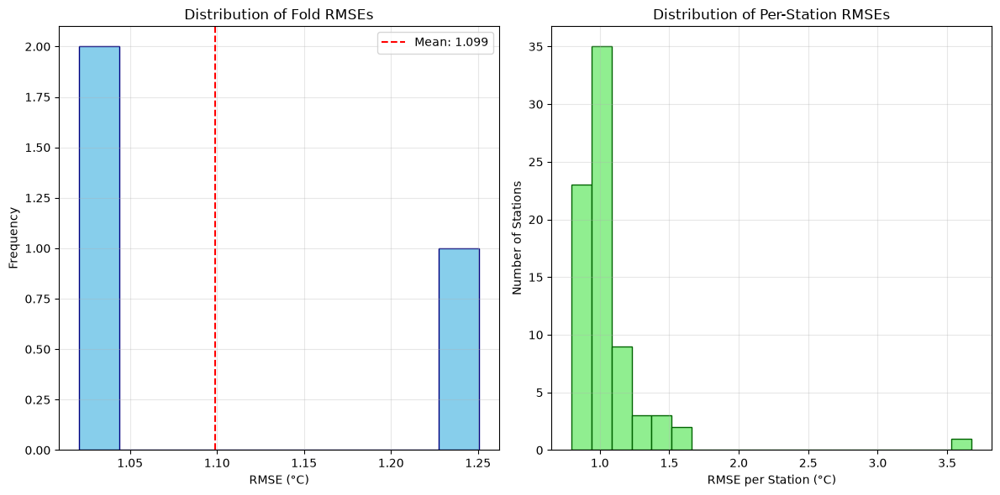

In [9]:
# 6. Plot RMSE Distribution
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.hist(fold_scores, bins=10, color='skyblue', edgecolor='navy')
plt.axvline(x=np.mean(fold_scores), color='red', linestyle='--', label=f'Mean: {np.mean(fold_scores):.3f}')
plt.xlabel('RMSE (°C)')
plt.ylabel('Frequency')
plt.title('Distribution of Fold RMSEs')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
station_rmse_series = pd.Series(per_station_scores)
plt.hist(station_rmse_series, bins=20, color='lightgreen', edgecolor='darkgreen')
plt.xlabel('RMSE per Station (°C)')
plt.ylabel('Number of Stations')
plt.title('Distribution of Per-Station RMSEs')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

Visualize worst stations, what do they have in common?
In comparison with all 76 stations, do they stand out in some way? (e.g. based on the static predictors)


Top 10 Worst-Performing Stations:


,station_id,rmse,latitude,longitude
0,DOBHAP,3.675995,51.513201,7.463924
1,DOBHAP,3.675995,51.513201,7.463924
2,DOBHAP,3.675995,51.513201,7.463924
3,DOBHAP,3.675995,51.513201,7.463924
4,DOBHAP,3.675995,51.513201,7.463924
...,...,...,...,...
69177,DOTEPM,1.195663,51.491512,7.495524
69178,DOTEPM,1.195663,51.491512,7.495524
69179,DOTEPM,1.195663,51.491512,7.495524
69180,DOTEPM,1.195663,51.491512,7.495524


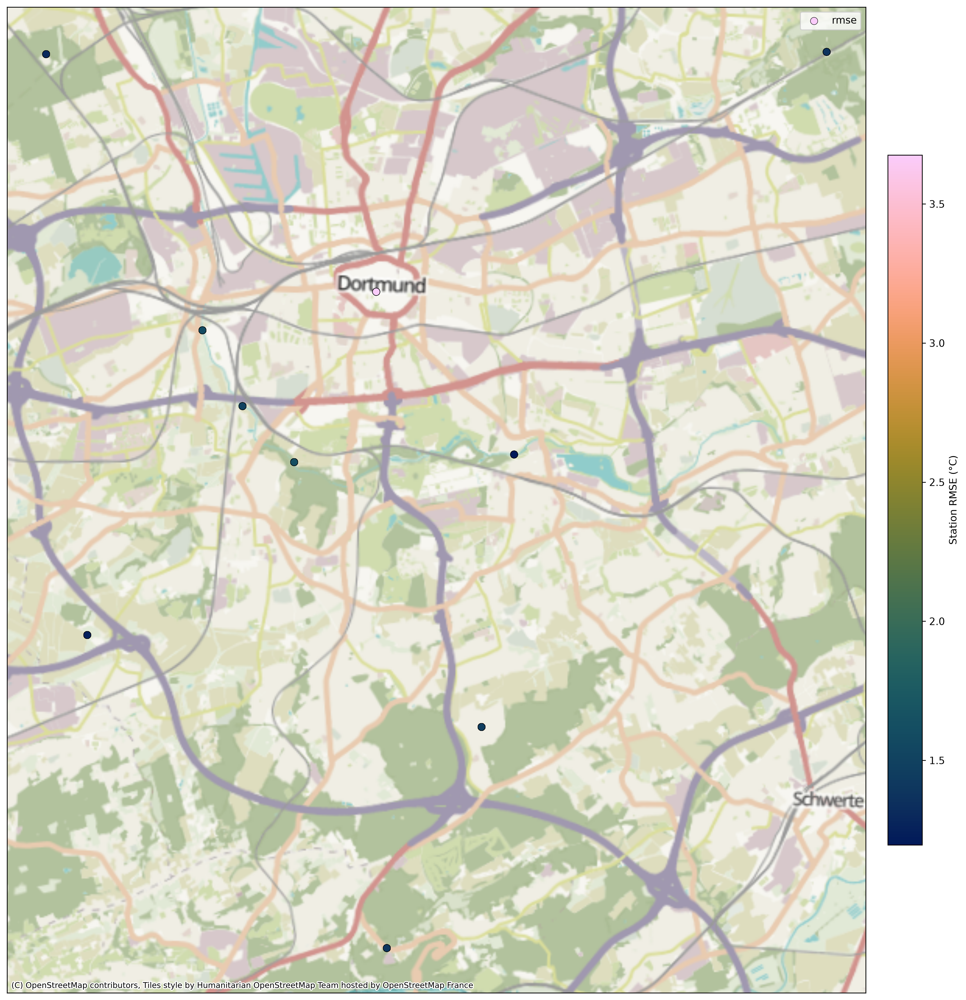

In [10]:
print("\nTop 10 Worst-Performing Stations:")
worst_stations = sorted(per_station_scores.items(), key=lambda x: x[1], reverse=True)[:10]

worst_stations_df = pd.DataFrame(worst_stations, columns=["station_id", "rmse"]).merge(df[["station_id", "latitude", "longitude"]])
display(worst_stations_df)

# obs_map(worst_stations_df, "rmse")


from pyproj import Transformer
import contextily as ctx

stn = worst_stations_df.copy()
# we want to plot using a projection that is suited to all of Europe instead of Mercator
# x and y represent easting and northing in this CRS, respectively
to_3035 = Transformer.from_crs("EPSG:4326", "EPSG:3035", always_xy=True)
stn["x"], stn["y"] = to_3035.transform(stn["longitude"].values, stn["latitude"].values)


# we set up the extent of the figure by adding a bit of padding around the extreme locations 
# of the stations
padx = (stn["x"].max() - stn["x"].min()) * 0.05
pady = (stn["y"].max() - stn["y"].min()) * 0.05

# we create the figure with the given dimensions
fig, ax = plt.subplots(figsize=(20, 18), dpi=300)
ax.set_xlim(stn["x"].min() - padx, stn["x"].max() + padx)
ax.set_ylim(stn["y"].min() - pady, stn["y"].max() + pady)
ax.set_aspect("equal")

# shared color scale so square (train) and circle (val) colors are comparable
vmin, vmax = stn["rmse"].min(), stn["rmse"].max()

sc = ax.scatter(stn["x"], stn["y"], c=stn["rmse"], cmap=cmc.batlow,
            vmin=vmin, vmax=vmax, marker="o", s=55,
            edgecolors="black", linewidths=0.4, label="rmse")

cbar = fig.colorbar(sc, ax=ax, shrink=0.7, pad=0.02)
cbar.set_label("Station RMSE (°C)")
ax.legend(loc="upper right")

# use default basemap
ctx.add_basemap(ax, crs="EPSG:3035")


ax.set_xticks([]); ax.set_yticks([])

plt.show()


# Block 2: Main Experiment

Dortmund: Vary the number of training stations: 2, 5, 10, 25, 50, 70. Test on the fixed hold-out set at every level, and repeat each level with five to ten random draws of which stations go into training.

In [11]:
# fixed hold-out set for dortmund
stations = list(df["station_id"].unique())
hold_out_subset = random.sample(stations, 10)
hold_out_sample = df[df["station_id"].isin(hold_out_subset)]

print(f"Fixed hold out sample of stations: {hold_out_subset}")

results = []

print(f"Baseline 1 (ΔT=0): {rmse_perfect:.3f}\nBaseline 2 (mean ΔT): {rmse_mean:.3f}")

# IF YOU FINISH EARLY: set n to plateau numbers
n = 5
print(f"N stations {n}")

# IF YOU FINISH EARLY: set to True
FINISH_EARLY = False

start_time=time.time()

# VARY NUMBER OF DRAWS  
n_draws = 10

for draw in range(n_draws):

    # Create a random subset for training
    stations = list(df["station_id"].unique())
    train_station_subset = random.sample(stations, n)
    
    train_sample = df[df["station_id"].isin(train_station_subset)]
    # IF YOU FINISH EARLY: cut each record to one month
    if FINISH_EARLY:
        # e.g. cut to june data
        start_date = datetime.datetime(2025,6,1,0, tzinfo=datetime.UTC)
        end_date = datetime.datetime(2025,7,1,0, tzinfo=datetime.UTC)
        train_sample = train_sample[(train_sample["datetime_utc"]>=start_date) & (train_sample["datetime_utc"] < end_date)]
        hold_out_sample = hold_out_sample[(hold_out_sample["datetime_utc"]>=start_date) & (hold_out_sample["datetime_utc"] < end_date)]
    
    X_train_rf = train_sample[keep_features]
    y_train_rf = train_sample['temp_diff']

    X_test_rf = hold_out_sample[keep_features]
    y_test_rf = hold_out_sample['temp_diff']

    # Train Random Forest with default settings
    model = RandomForestRegressor(random_state=42, n_estimators=50, max_depth=10)  # as set initally!
    model.fit(X_train_rf, y_train_rf)

    # Predict on hold-out station
    y_pred = model.predict(X_test_rf)

    # Calculate RMSE
    rmse = root_mean_squared_error(y_test_rf, y_pred)
    results.append({
        'n_stations': len(train_station_subset),
        'rmse': rmse,
        'daytime':'allday',
        'n_train_samples': len(X_train_rf),
        'n_test_samples': len(X_test_rf)
    })

    if FINISH_EARLY:
        # enhance data with dropped features
        enhanced_test_df = df[hold_out_sample.index]

        # daytime rmse
        y_test_rf_day = enhanced_test_df[enhanced_test_df["datetime_utc"].dt.hour.isin(np.arange(6,18))]
        y_pred_day = df[X_test_rf.index][enhanced_test_df["datetime_utc"].dt.hour.isin(np.arange(6,18))]
        rmse = root_mean_squared_error(y_test_rf_day, y_pred_day)
        results.append({
            'n_stations': len(train_station_subset),
            'rmse': rmse,
            'daytime':'day',
            'n_train_samples': len(y_test_rf_day),
            'n_test_samples': len(y_pred_day)
        })

        # nighttime rmse
        y_test_rf_night = enhanced_test_df[~enhanced_test_df["datetime_utc"].dt.hour.isin(np.arange(6,18))]
        y_pred_night = df[X_test_rf.index][enhanced_test_df["datetime_utc"].dt.hour.isin(np.arange(6,18))]

        rmse = root_mean_squared_error(y_test_rf_night, y_pred_night)
        results.append({
            'n_stations': len(train_station_subset),
            'rmse': rmse,
            'daytime':'night',
            'n_train_samples': len(y_test_rf_night),
            'n_test_samples': len(y_pred_night)
        })


print(f"Elapsed time: {datetime.timedelta(seconds=time.time() - start_time)}")

# Convert results to DataFrame
results_df = pd.DataFrame(results)
print("\n" + "="*50)
print("FINAL RESULTS:")
print(results_df.to_string(index=False))
results_df.to_csv(f"results_randomforest_{n}_stations.csv")

Fixed hold out sample of stations: ['DOTAMB', 'DOTADR', 'DOBSPS', 'DOBNOM', 'DOTTPS', 'DOBKPW', 'DOTLST', 'DOBDKP', 'DOBDHS', 'DOTVGS']
Baseline 1 (ΔT=0): 1.619
Baseline 2 (mean ΔT): 1.523
N stations 5
Elapsed time: 0:03:11.740024

FINAL RESULTS:
 n_stations     rmse daytime  n_train_samples  n_test_samples
          5 1.045917  allday            42080           79077
          5 1.067320  allday            41093           79077
          5 1.176576  allday            37226           79077
          5 1.062813  allday            36991           79077
          5 1.078983  allday            36426           79077
          5 1.009758  allday            43783           79077
          5 1.043906  allday            36221           79077
          5 4.147879  allday            42911           79077
          5 1.107734  allday            37088           79077
          5 1.155655  allday            31351           79077


2
mean    1.177277
std     0.227647
Name: rmse, dtype: float64
5
mean    1.389654
std     0.970492
Name: rmse, dtype: float64
10
mean    1.451013
std     0.596690
Name: rmse, dtype: float64


Text(0.5, 1.0, 'Learning Curve')

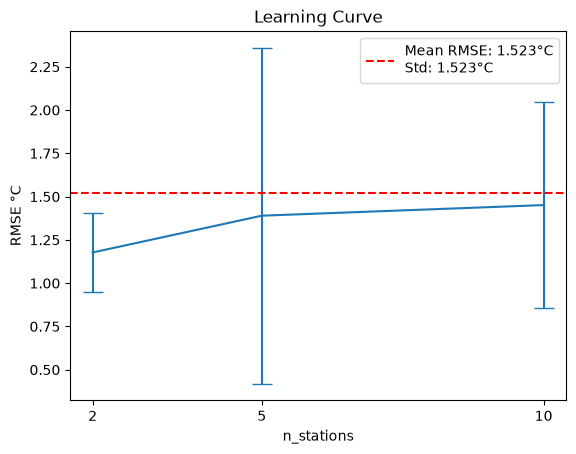

In [12]:
# load results per run and plot against each other

# learning curve in a boxplot way, can also be done in a lineplot with errorbars
means = []
stds = []
n_stations = [2, 5, 10]
for n in n_stations:
    print(n)
    result_stats = pd.read_csv(f"results_randomforest_{n}_stations.csv")
    meanstd = result_stats[result_stats["daytime"]=="allday"]["rmse"].agg(func=["mean", "std"])
    print(meanstd)
    means.append(meanstd["mean"])
    stds.append(meanstd["std"])

plt.errorbar(n_stations, means, yerr=stds, capsize=7)
plt.axhline(y=rmse_mean, color='red', linestyle='--',
            label=f'Mean RMSE: {rmse_mean:.3f}°C\nStd: {rmse_mean:.3f}°C')
plt.legend()

plt.xlabel("n_stations")
plt.ylabel("RMSE °C")
plt.xticks(n_stations)
plt.title("Learning Curve")
    # ax.plot(n, results_df["rmse"].mean())
    # results_df["rmse"].plot.box(ax=ax)
    # title=f"N_stations: {list(results_df['n_stations'].unique())[0]}"